In [2]:
import torch
from sklearn.model_selection import train_test_split

# load data from data folder(we"re in notebooks folder)
sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(
    train_data, test_size=0.2, random_state=42)

/tmp/ipykernel_238157/1126774367.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')


In [3]:
import optuna
from torch import nn

# load existing study
study = optuna.load_study(
    study_name="AutoEncoder_10", storage="sqlite:///optuna.db")

hyperparameters_dict = {
    "num_layers": 5,
    "poolsize": [2, 2, 2, 2, 5],
    "channels": [3, 12, 7, 7, 11, 12],
    "kernel_sizes": [15, 10, 14, 14, 14],
    "dilations": [5, 5, 3, 3, 1],
    "activations": [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU],
    "lr": 0.0002568457560593339,
    "batch_size": 32,
    "beta" : 1.0,
    "n_clusters": 13
}

In [4]:
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
import lightning as L
from torch.utils.data import DataLoader
from models import LitAE

lit_model = LitAE(hyperparameters=hyperparameters_dict, cluster=True, gif=True)

# save encoder, decoder weights
lit_model.model.encoder.load_state_dict(torch.load('./saved_models/vanilla_encoder_state_dict.pt'))
lit_model.model.decoder.load_state_dict(torch.load('./saved_models/vanilla_decoder_state_dict.pt'))

2024-10-17 06:41:49.708470: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-17 06:41:49.723933: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-17 06:41:49.728601: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-17 06:41:49.740183: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-17 06:41:51.324214: W tensorflow/comp

<All keys matched successfully>

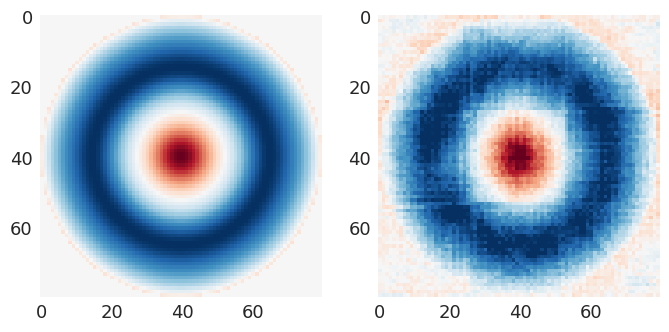

1_skyrmion


In [5]:
from plot import plot_recon
plot_recon(lit_model.model, test_data, 5)

In [12]:
import optuna
from sklearn.cluster import HDBSCAN
from cluster_acc import purity, adj_rand_index

feature_array = lit_model.model.encoder(sim_arr_tensor).detach().numpy()
feature_array = feature_array.reshape(feature_array.shape[0], -1)

hdbscan_model = HDBSCAN(min_cluster_size=3,
                        min_samples=1,
                        cluster_selection_epsilon=0.5,
                        allow_single_cluster=True)
hdbscan_model.fit(feature_array)
labels = hdbscan_model.labels_
print(f'Purity: {purity(labels)}')
print(f'ARI: {adj_rand_index(labels)}')

Purity: 0.9647840531561461
ARI: 0.6150840530802729


In [15]:
import plotly.io as pio
pio.renderers.default = "browser"


from plot import plot_class
plot_class(labels)

Number of classes:  13


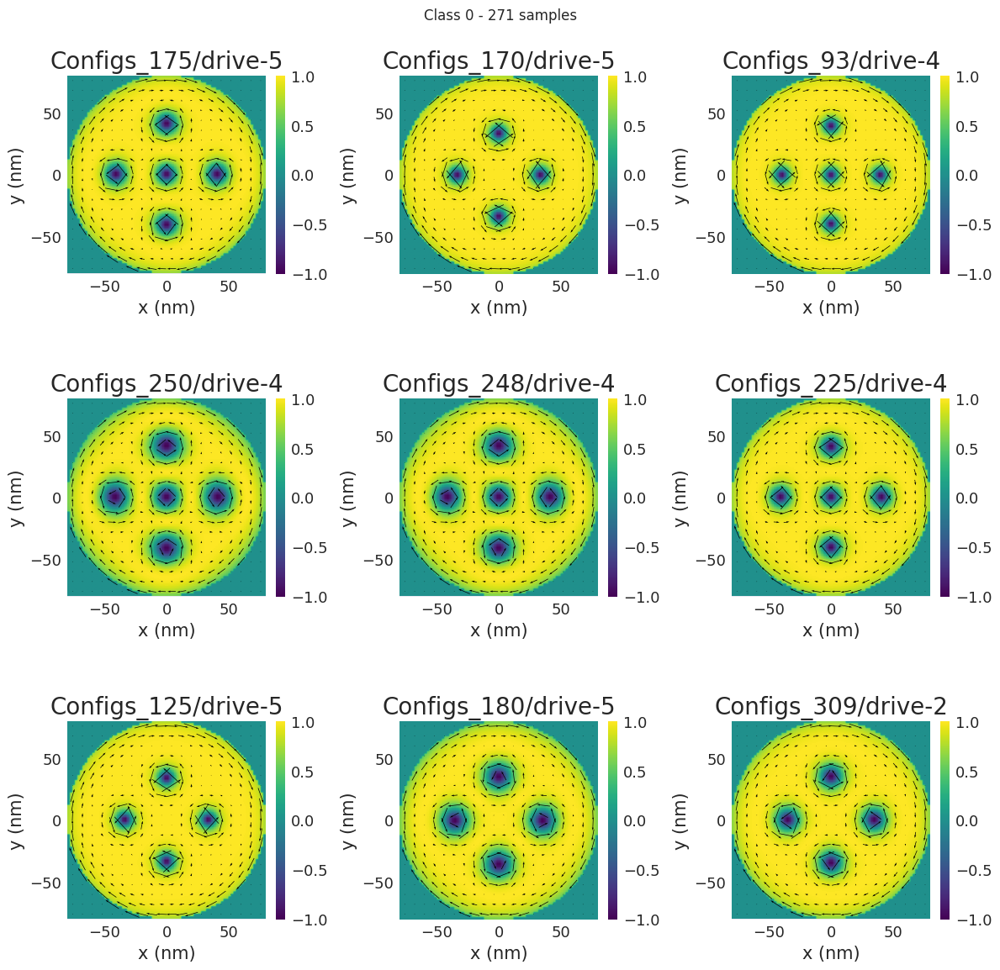

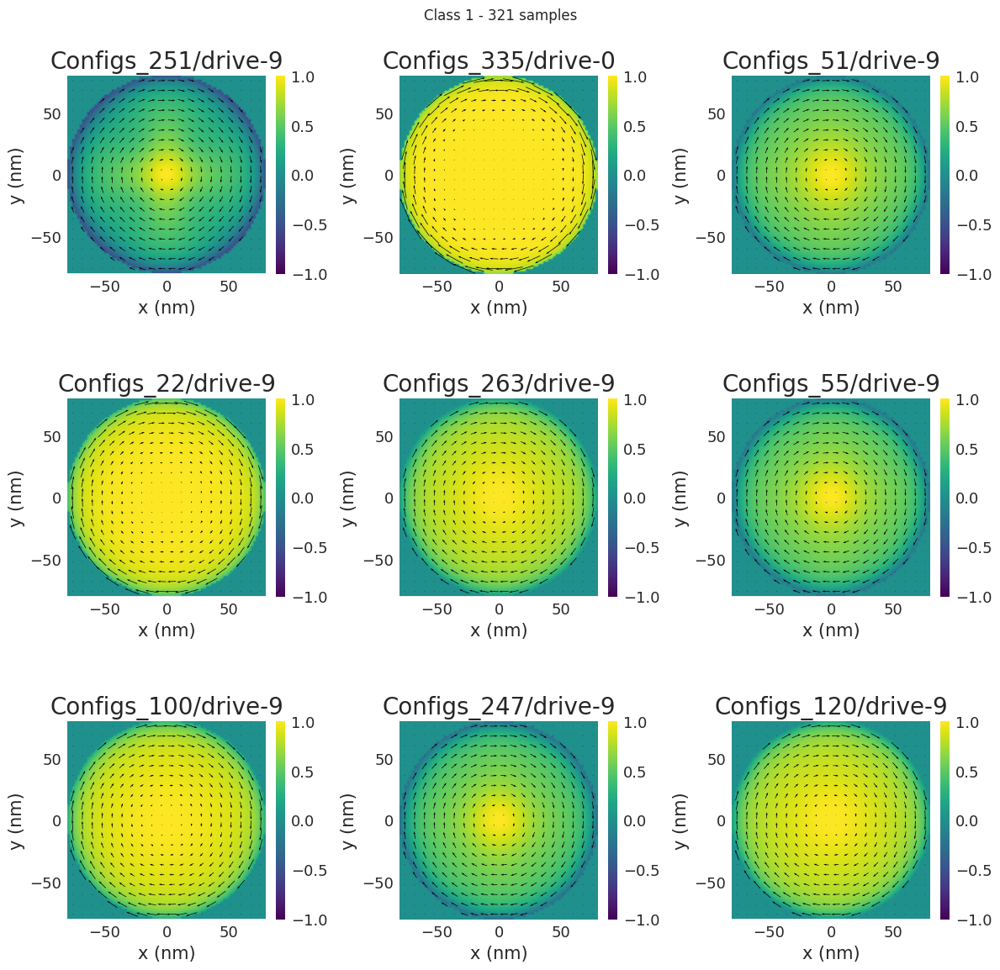

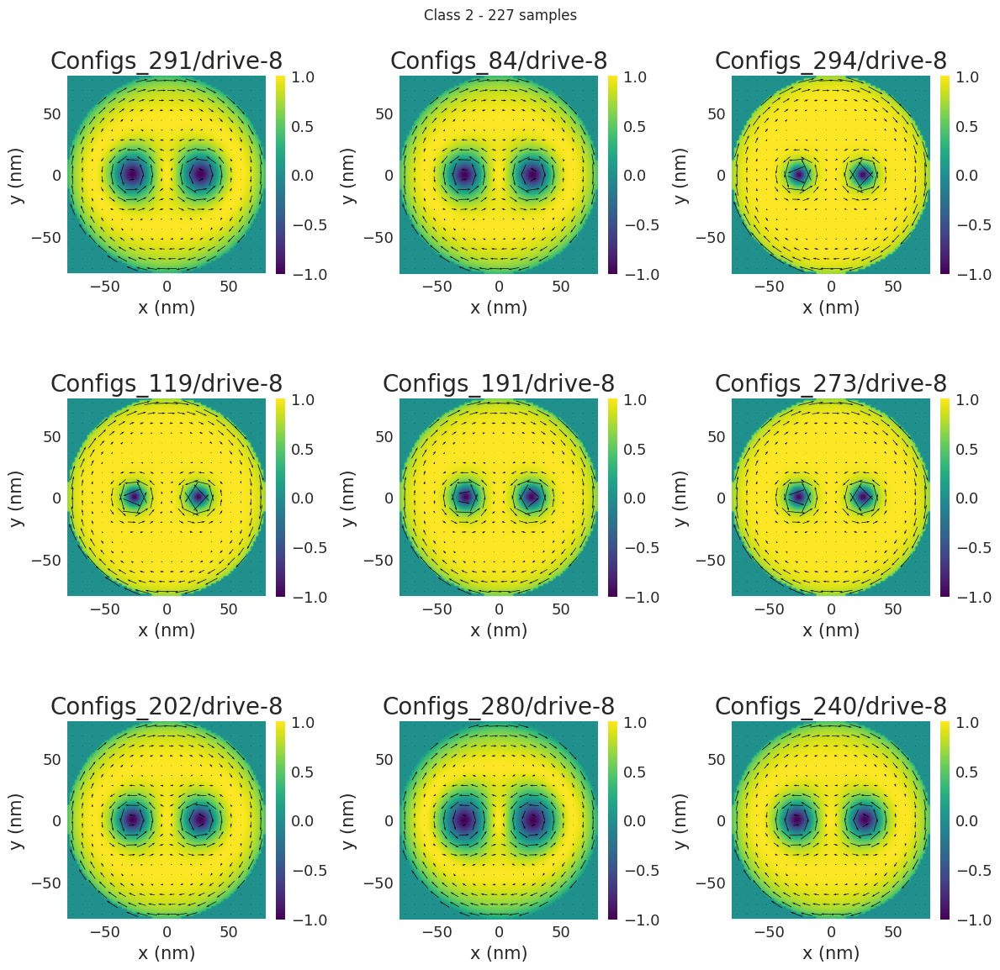

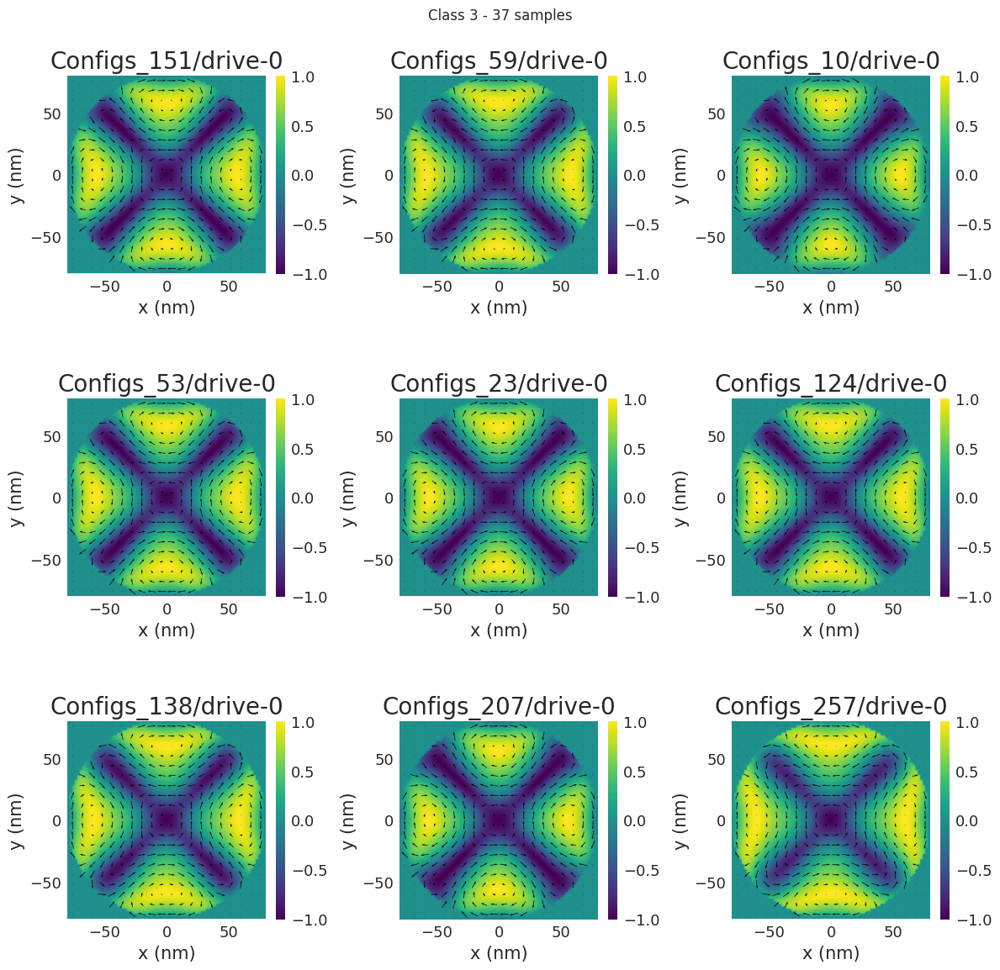

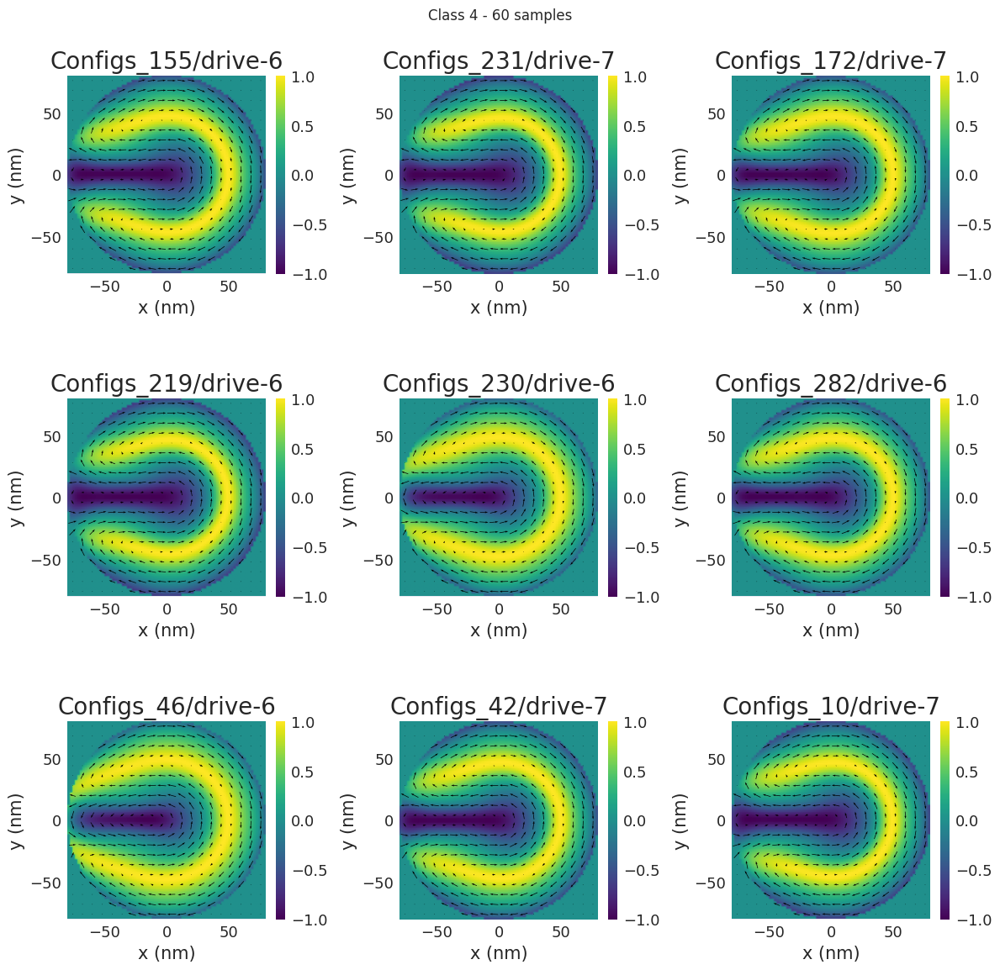

...

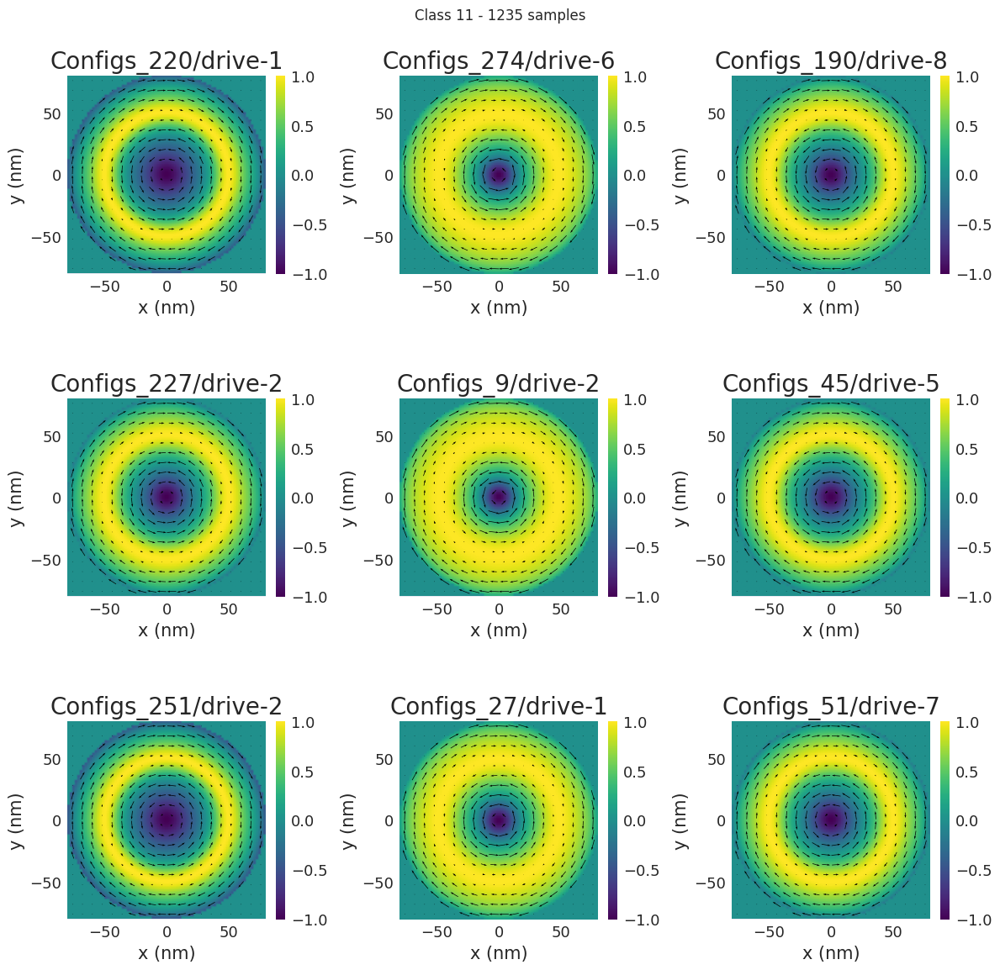

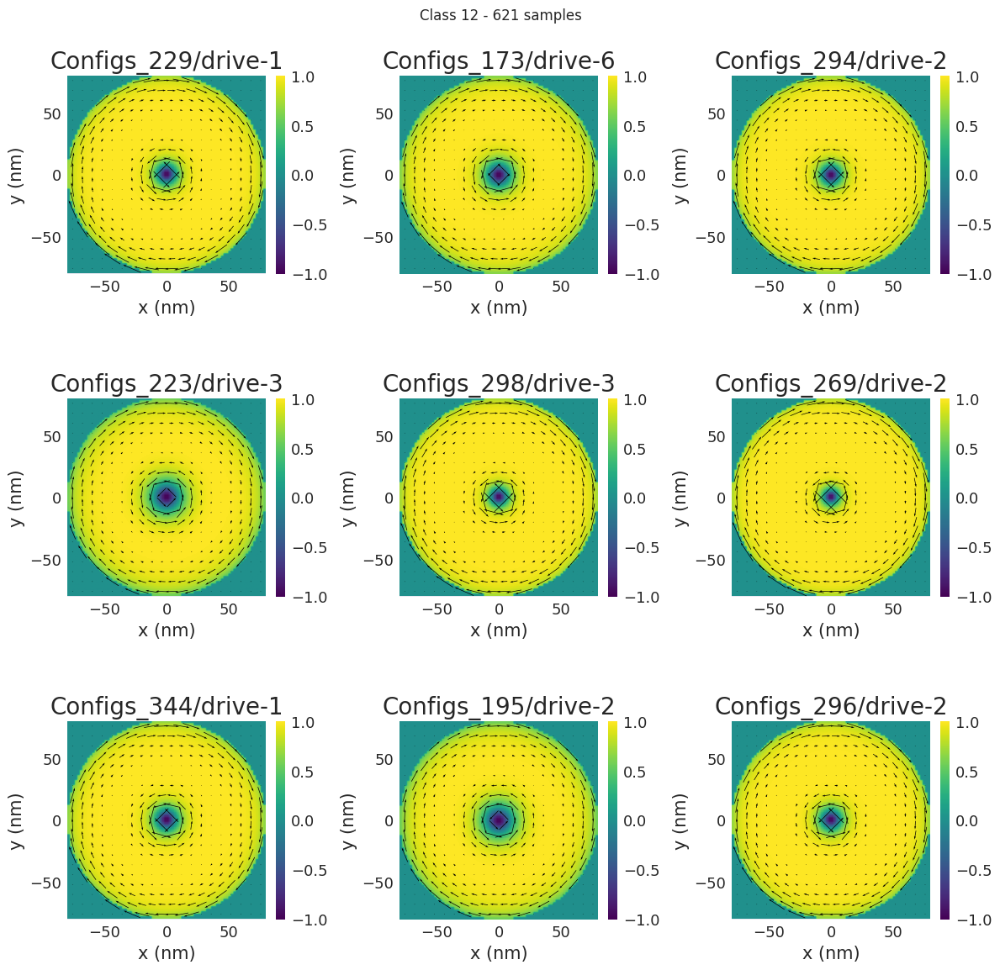

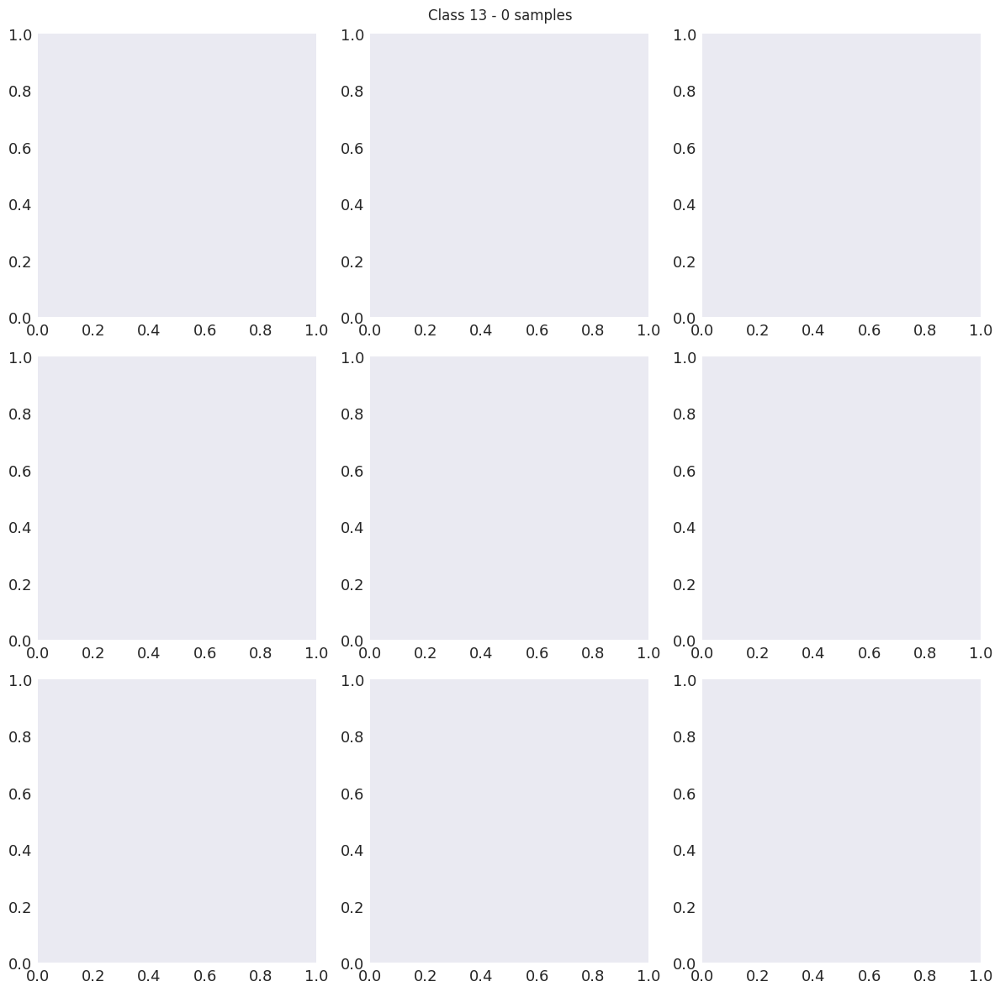

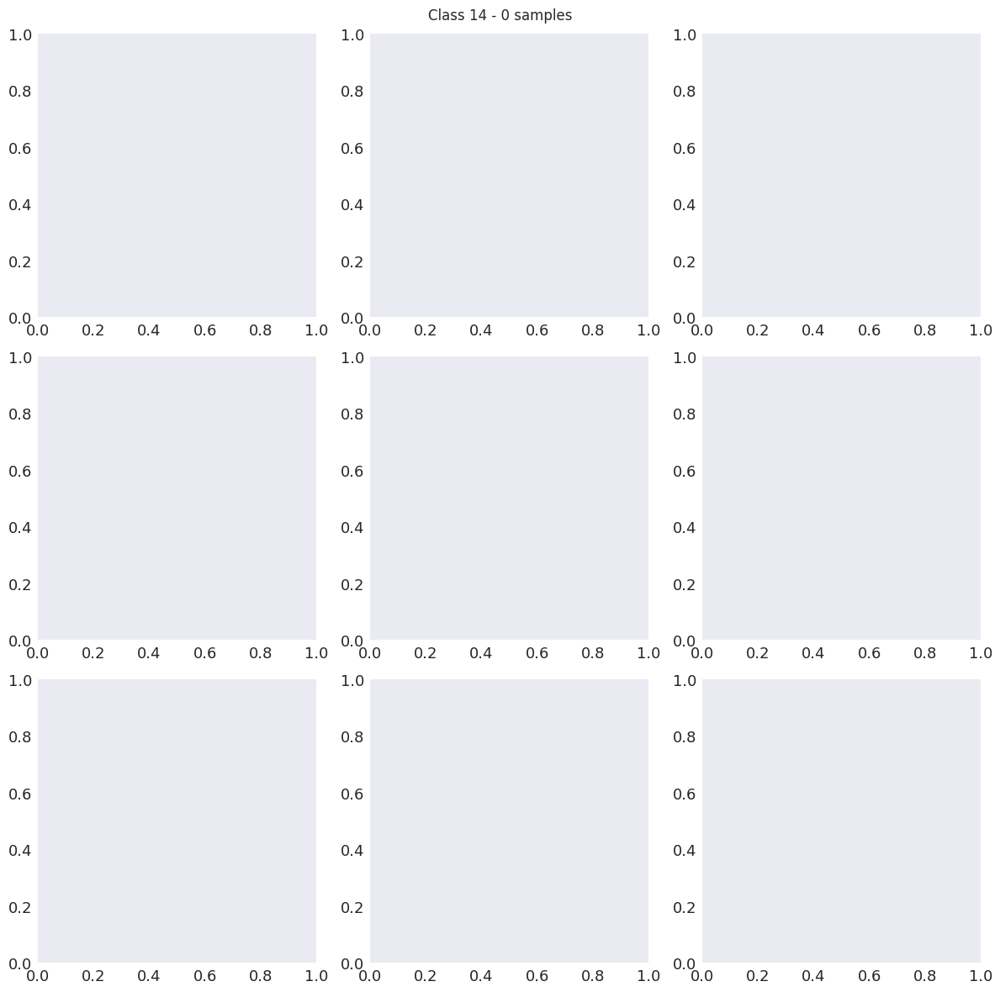

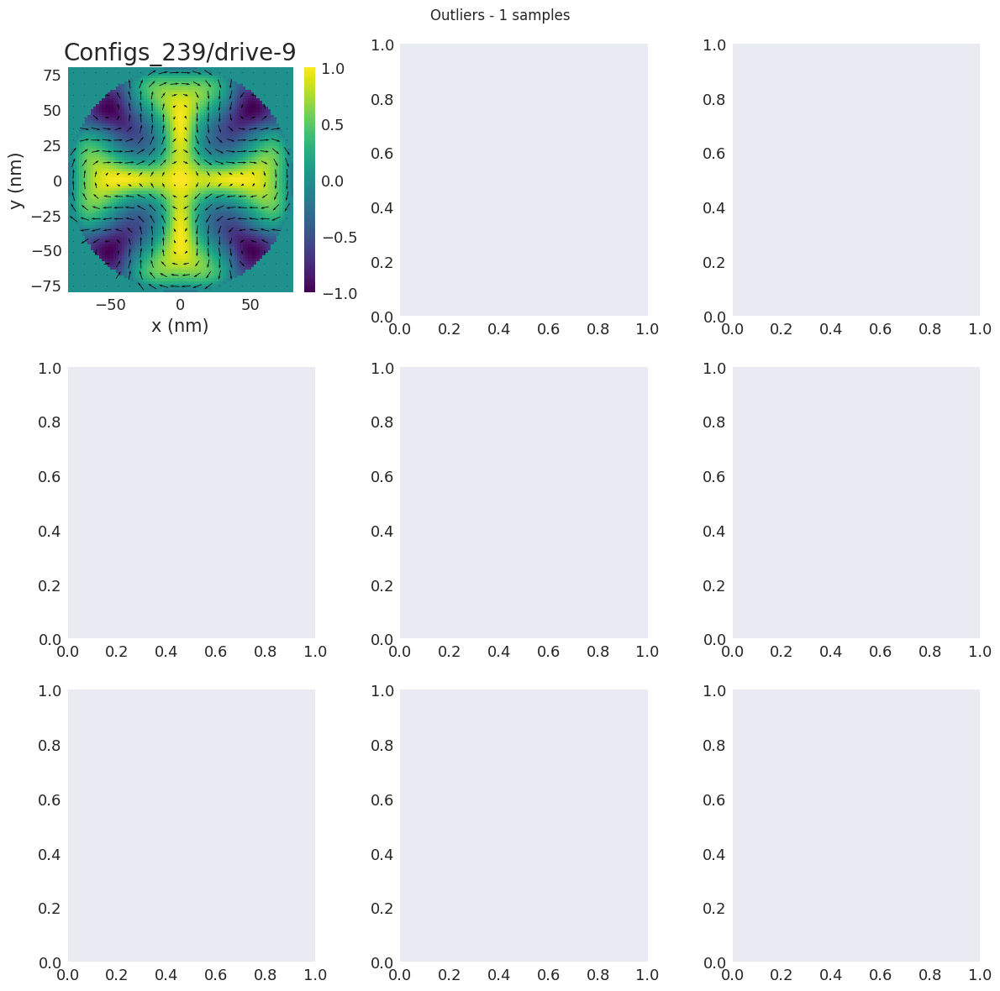

In [14]:
from plot import plot_all_examples

plot_all_examples(labels)